In [1]:
import torch
from torch import nn, optim
import torchvision
from torchvision import datasets, transforms

In [2]:
from torch.nn import ModuleList

In [3]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import numpy as np
import pandas as pd
import time
from __future__ import print_function

%matplotlib inline

### Data

In [4]:
batch_size = 12

train_data = datasets.MNIST('..\datasetws', train=True, download=True, transform=transforms.ToTensor())
test_data = datasets.MNIST('D:\datasetws', train=True, download=True, transform=transforms.ToTensor())

train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size)

C:\Users\xion8\anaconda3\lib\site-packages\torchvision\datasets\mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  ..\torch\csrc\utils\tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


### Model

In [5]:
class MLP(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.in_dim = 28*28 # MNIST
        self.out_dim = 10
        
        self.fc1 = nn.Linear(self.in_dim, 512)
        self.fc2 = nn.Linear(512, 256)
        self.fc3 = nn.Linear(256, 128)
        self.fc4 = nn.Linear(128, 64)
        self.fc5 = nn.Linear(64, self.out_dim)
        
        self.relu = nn.ReLU()
        self.log_softmax = nn.LogSoftmax()
        
    def forward(self, x):
        z1 = self.fc1(x.view(-1, self.in_dim))
        a1 = self.relu(z1)
        z2 = self.fc2(a1)
        a2 = self.relu(z2)
        a3 = self.relu(self.fc3(a2))
        a4 = self.relu(self.fc4(a3))
        logit = self.fc5(a4)
        return x, z1, a1, z2, a2, logit

### Train

In [6]:
model = MLP()
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr = 0.01)

In [7]:
torch.save(model.state_dict(), "model.pt")

In [8]:
a0 = []
z1 = []
a1 = []
z2 = []
a2 = []
l = []

for epoch in range(10):
    running_loss = 0.0
    for i, data in enumerate(train_loader, 0):
        # get the inputs: data is a list of [inputs, labels]
        inputs, labels = data
        
        # zero the parameter gradients
        model.zero_grad()
        
        #forward + backward + optimize
        outputs = model(inputs)
        
        if (epoch == 9):
            for j in range(batch_size):
                a0.append(outputs[0][j].detach().numpy().ravel())
                z1.append(outputs[1][j].detach().numpy().ravel())
                a1.append(outputs[2][j].detach().numpy().ravel())
                z2.append(outputs[3][j].detach().numpy().ravel())
                a2.append(outputs[4][j].detach().numpy().ravel())
                l.append(labels[j].detach().numpy())
        
        loss = criterion(outputs[5], labels)
        loss.backward()
        optimizer.step()
        
        #print statistics
        running_loss += loss.item()
        if (i+1) % 2000 == 0:
            print('[%d, %5d] loss : %.3f' % (epoch + 1, i + 1, running_loss / 2000))
            running_loss = 0.0

print('Finished Traning')

[1,  2000] loss : 2.123
[1,  4000] loss : 0.631
[2,  2000] loss : 0.317
[2,  4000] loss : 0.242
[3,  2000] loss : 0.169
[3,  4000] loss : 0.145
[4,  2000] loss : 0.114
[4,  4000] loss : 0.104
[5,  2000] loss : 0.080
[5,  4000] loss : 0.082
[6,  2000] loss : 0.061
[6,  4000] loss : 0.066
[7,  2000] loss : 0.047
[7,  4000] loss : 0.052
[8,  2000] loss : 0.035
[8,  4000] loss : 0.041
[9,  2000] loss : 0.027
[9,  4000] loss : 0.037
[10,  2000] loss : 0.024
[10,  4000] loss : 0.022
Finished Traning


In [9]:
a0 = np.array(a0)
z1 = np.array(z1)
a1 = np.array(a1)
z2 = np.array(z2)
a2 = np.array(a2)
l = np.array(l)

In [10]:
df_a0 = pd.DataFrame(a0)
df_a0['y'] = l

df_z1 = pd.DataFrame(z1)
df_z1['y'] = l

df_a1 = pd.DataFrame(a1)
df_a1['y'] = l

df_z2 = pd.DataFrame(z2)
df_z2['y'] = l

df_a2 = pd.DataFrame(a2)
df_a2['y'] = l

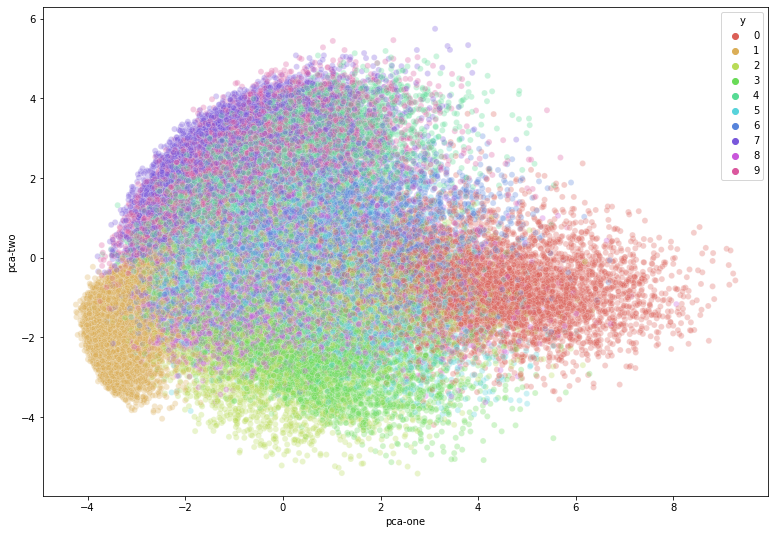

In [11]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_a0[range(784)].values)

df_a0['pca-one'] = pca_result[:,0]
df_a0['pca-two'] = pca_result[:,1]

plt.figure(figsize=(13,9))
sns.scatterplot(
    x="pca-one", y="pca-two",
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df_a0,
    legend="full",
    alpha=0.3
)
plt.show()

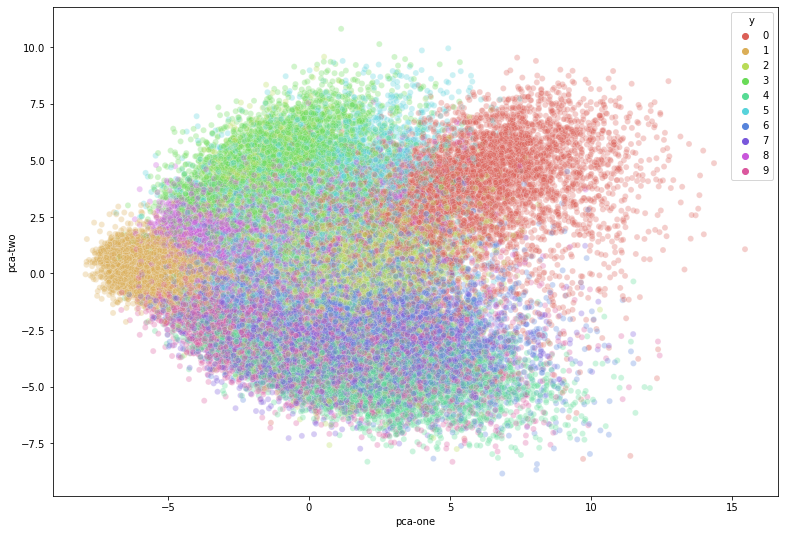

In [12]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_z1[range(512)].values)

df_z1['pca-one'] = pca_result[:,0]
df_z1['pca-two'] = pca_result[:,1]

plt.figure(figsize=(13,9))
sns.scatterplot(
    x="pca-one", y="pca-two",
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df_z1,
    legend="full",
    alpha=0.3
)
plt.show()

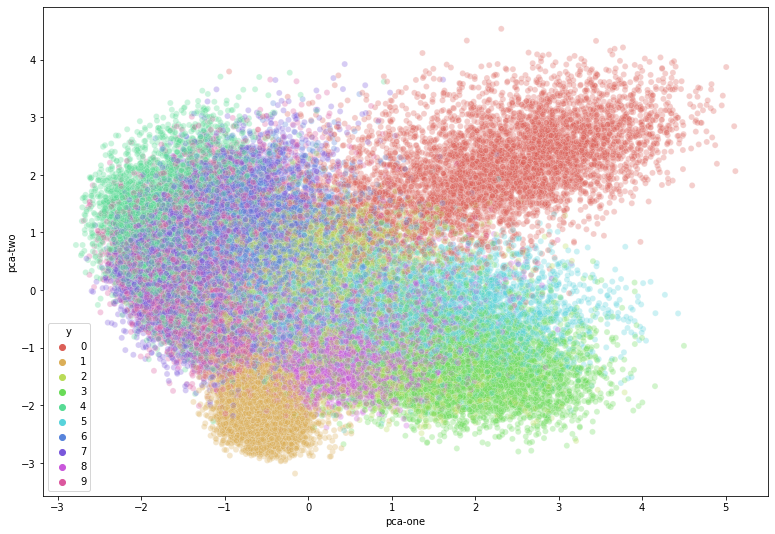

In [13]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_a1[range(512)].values)

df_a1['pca-one'] = pca_result[:,0]
df_a1['pca-two'] = pca_result[:,1]

plt.figure(figsize=(13,9))
sns.scatterplot(
    x="pca-one", y="pca-two",
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df_a1,
    legend="full",
    alpha=0.3
)
plt.show()

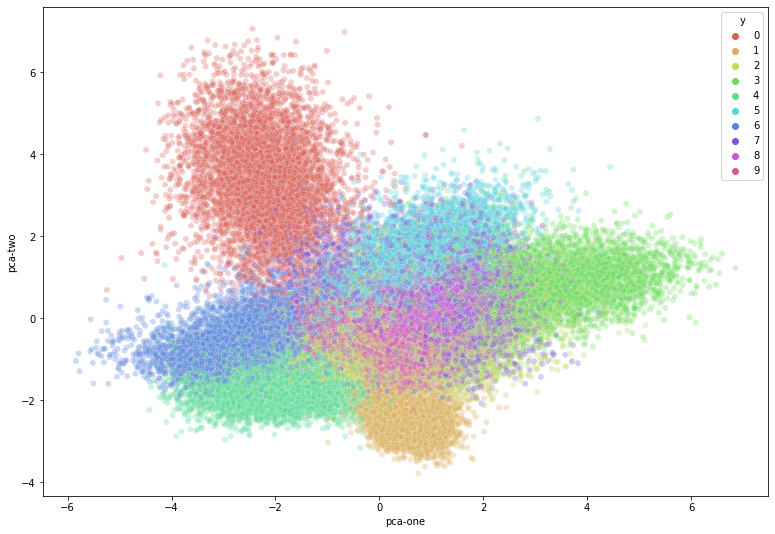

In [14]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_z2[range(256)].values)

df_z2['pca-one'] = pca_result[:,0]
df_z2['pca-two'] = pca_result[:,1]

plt.figure(figsize=(13,9))
sns.scatterplot(
    x="pca-one", y="pca-two",
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df_z2,
    legend="full",
    alpha=0.3
)
plt.show()

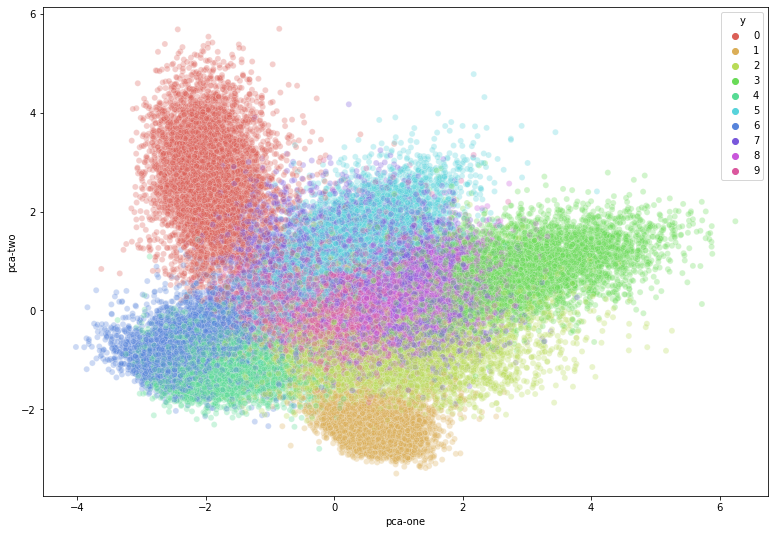

In [15]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_a2[range(256)].values)

df_a2['pca-one'] = pca_result[:,0]
df_a2['pca-two'] = pca_result[:,1]

plt.figure(figsize=(13,9))
sns.scatterplot(
    x="pca-one", y="pca-two",
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df_a2,
    legend="full",
    alpha=0.3
)
plt.show()

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 60000 samples in 0.031s...
[t-SNE] Computed neighbors for 60000 samples in 123.484s...
[t-SNE] Computed conditional probabilities for sample 1000 / 60000
[t-SNE] Computed conditional probabilities for sample 2000 / 60000
[t-SNE] Computed conditional probabilities for sample 3000 / 60000
[t-SNE] Computed conditional probabilities for sample 4000 / 60000
[t-SNE] Computed conditional probabilities for sample 5000 / 60000
[t-SNE] Computed conditional probabilities for sample 6000 / 60000
[t-SNE] Computed conditional probabilities for sample 7000 / 60000
[t-SNE] Computed conditional probabilities for sample 8000 / 60000
[t-SNE] Computed conditional probabilities for sample 9000 / 60000
[t-SNE] Computed conditional probabilities for sample 10000 / 60000
[t-SNE] Computed conditional probabilities for sample 11000 / 60000
[t-SNE] Computed conditional probabilities for sample 12000 / 60000
[t-SNE] Computed conditional probabilities for 

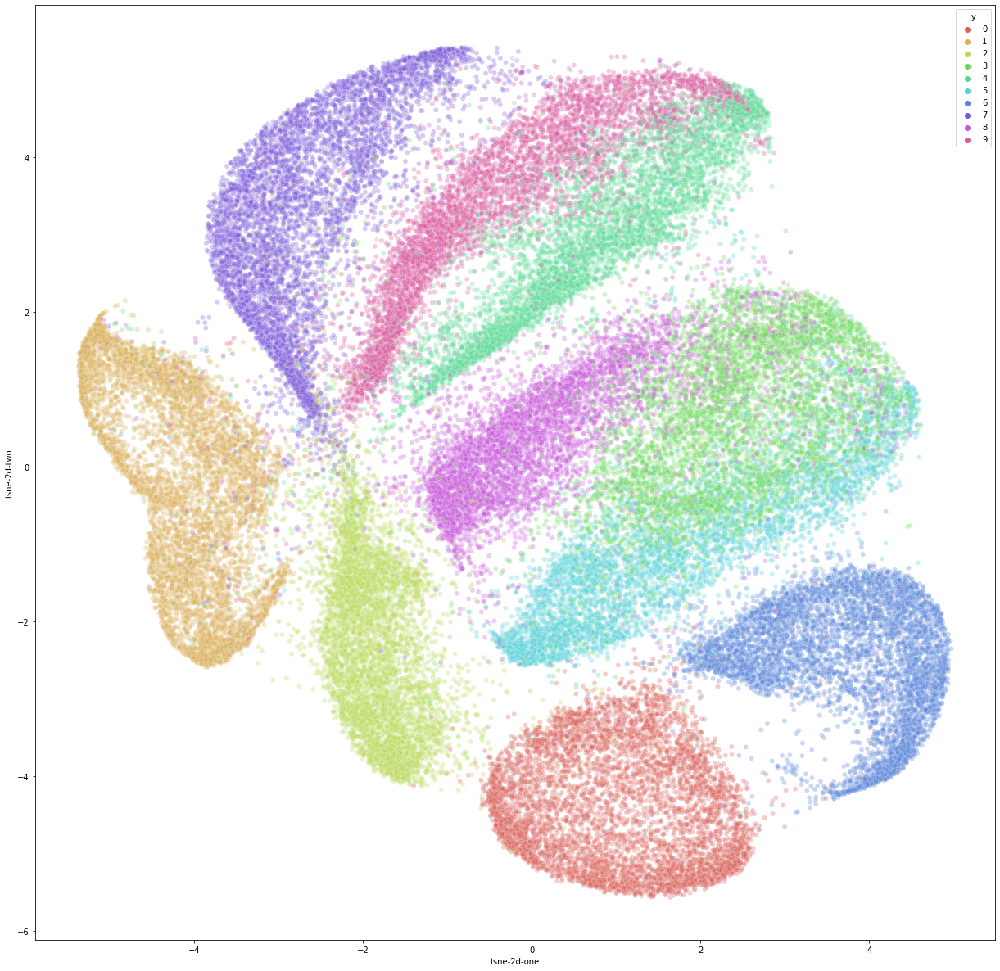

In [16]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(df_a0[range(784)].values)
df_a0['tsne-2d-one'] = tsne_results[:,0]
df_a0['tsne-2d-two'] = tsne_results[:,1]
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

plt.figure(figsize=(21,21))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df_a0,
    legend="full",
    alpha=0.3
)
plt.show()

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 60000 samples in 0.020s...
[t-SNE] Computed neighbors for 60000 samples in 113.277s...
[t-SNE] Computed conditional probabilities for sample 1000 / 60000
[t-SNE] Computed conditional probabilities for sample 2000 / 60000
[t-SNE] Computed conditional probabilities for sample 3000 / 60000
[t-SNE] Computed conditional probabilities for sample 4000 / 60000
[t-SNE] Computed conditional probabilities for sample 5000 / 60000
[t-SNE] Computed conditional probabilities for sample 6000 / 60000
[t-SNE] Computed conditional probabilities for sample 7000 / 60000
[t-SNE] Computed conditional probabilities for sample 8000 / 60000
[t-SNE] Computed conditional probabilities for sample 9000 / 60000
[t-SNE] Computed conditional probabilities for sample 10000 / 60000
[t-SNE] Computed conditional probabilities for sample 11000 / 60000
[t-SNE] Computed conditional probabilities for sample 12000 / 60000
[t-SNE] Computed conditional probabilities for 

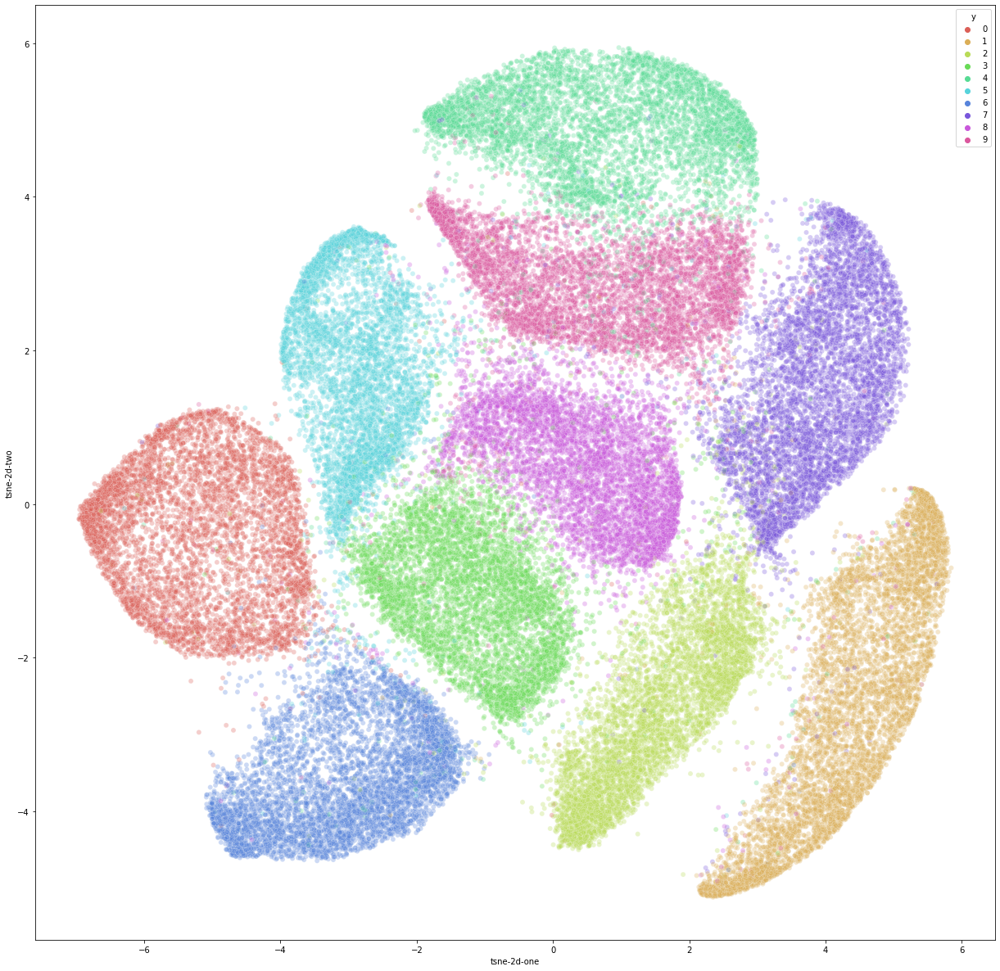

In [17]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(df_z1[range(512)].values)
df_z1['tsne-2d-one'] = tsne_results[:,0]
df_z1['tsne-2d-two'] = tsne_results[:,1]
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

plt.figure(figsize=(21,21))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df_z1,
    legend="full",
    alpha=0.3
)
plt.show()

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 60000 samples in 0.022s...
[t-SNE] Computed neighbors for 60000 samples in 109.262s...
[t-SNE] Computed conditional probabilities for sample 1000 / 60000
[t-SNE] Computed conditional probabilities for sample 2000 / 60000
[t-SNE] Computed conditional probabilities for sample 3000 / 60000
[t-SNE] Computed conditional probabilities for sample 4000 / 60000
[t-SNE] Computed conditional probabilities for sample 5000 / 60000
[t-SNE] Computed conditional probabilities for sample 6000 / 60000
[t-SNE] Computed conditional probabilities for sample 7000 / 60000
[t-SNE] Computed conditional probabilities for sample 8000 / 60000
[t-SNE] Computed conditional probabilities for sample 9000 / 60000
[t-SNE] Computed conditional probabilities for sample 10000 / 60000
[t-SNE] Computed conditional probabilities for sample 11000 / 60000
[t-SNE] Computed conditional probabilities for sample 12000 / 60000
[t-SNE] Computed conditional probabilities for 

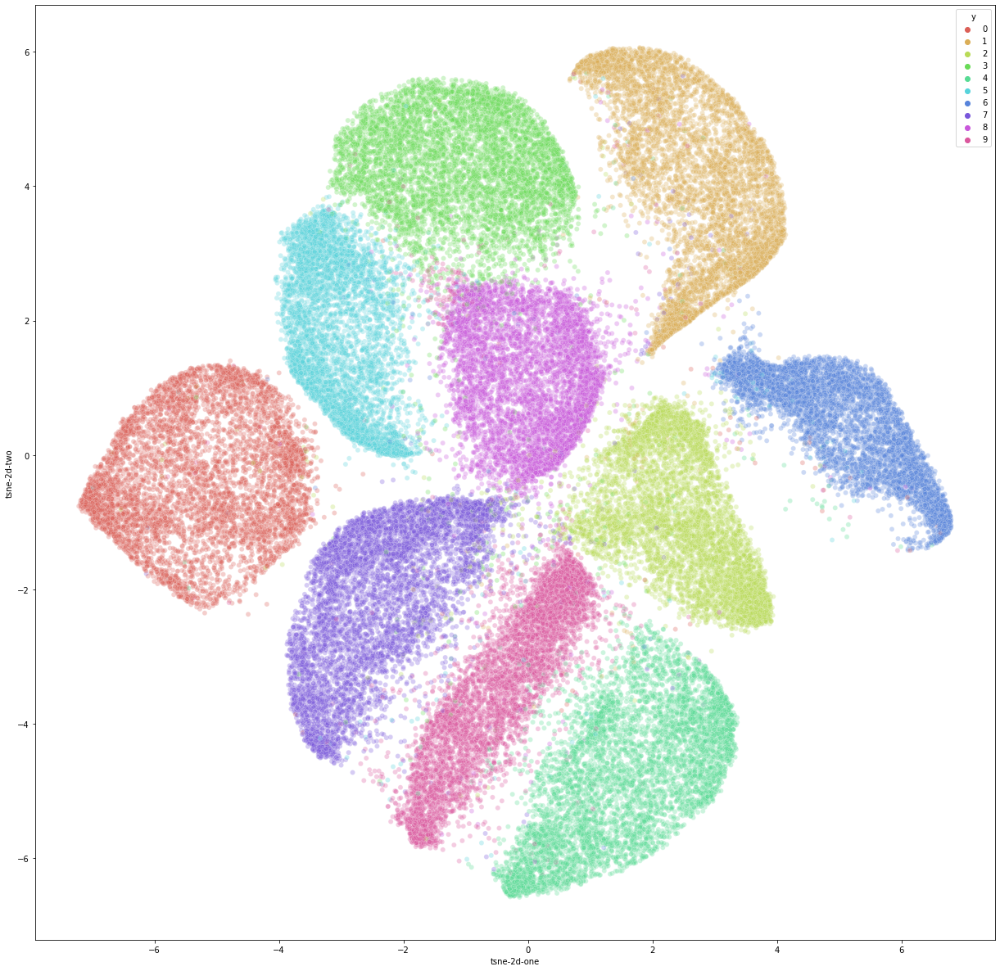

In [18]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(df_a1[range(512)].values)
df_a1['tsne-2d-one'] = tsne_results[:,0]
df_a1['tsne-2d-two'] = tsne_results[:,1]
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

plt.figure(figsize=(21,21))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df_a1,
    legend="full",
    alpha=0.3
)
plt.show()

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 60000 samples in 0.011s...
[t-SNE] Computed neighbors for 60000 samples in 95.254s...
[t-SNE] Computed conditional probabilities for sample 1000 / 60000
[t-SNE] Computed conditional probabilities for sample 2000 / 60000
[t-SNE] Computed conditional probabilities for sample 3000 / 60000
[t-SNE] Computed conditional probabilities for sample 4000 / 60000
[t-SNE] Computed conditional probabilities for sample 5000 / 60000
[t-SNE] Computed conditional probabilities for sample 6000 / 60000
[t-SNE] Computed conditional probabilities for sample 7000 / 60000
[t-SNE] Computed conditional probabilities for sample 8000 / 60000
[t-SNE] Computed conditional probabilities for sample 9000 / 60000
[t-SNE] Computed conditional probabilities for sample 10000 / 60000
[t-SNE] Computed conditional probabilities for sample 11000 / 60000
[t-SNE] Computed conditional probabilities for sample 12000 / 60000
[t-SNE] Computed conditional probabilities for s

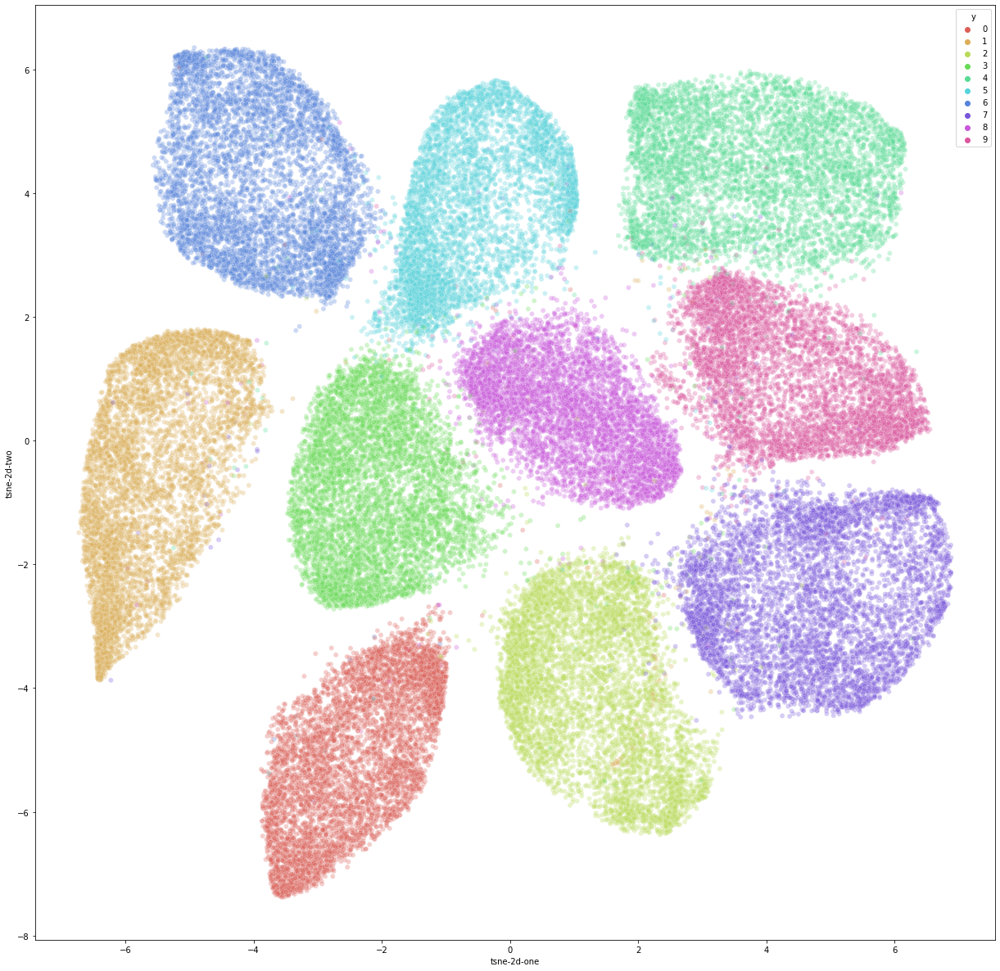

In [19]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(df_z2[range(256)].values)
df_z2['tsne-2d-one'] = tsne_results[:,0]
df_z2['tsne-2d-two'] = tsne_results[:,1]
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

plt.figure(figsize=(21,21))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df_z2,
    legend="full",
    alpha=0.3
)
plt.show()

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 60000 samples in 0.010s...
[t-SNE] Computed neighbors for 60000 samples in 90.560s...
[t-SNE] Computed conditional probabilities for sample 1000 / 60000
[t-SNE] Computed conditional probabilities for sample 2000 / 60000
[t-SNE] Computed conditional probabilities for sample 3000 / 60000
[t-SNE] Computed conditional probabilities for sample 4000 / 60000
[t-SNE] Computed conditional probabilities for sample 5000 / 60000
[t-SNE] Computed conditional probabilities for sample 6000 / 60000
[t-SNE] Computed conditional probabilities for sample 7000 / 60000
[t-SNE] Computed conditional probabilities for sample 8000 / 60000
[t-SNE] Computed conditional probabilities for sample 9000 / 60000
[t-SNE] Computed conditional probabilities for sample 10000 / 60000
[t-SNE] Computed conditional probabilities for sample 11000 / 60000
[t-SNE] Computed conditional probabilities for sample 12000 / 60000
[t-SNE] Computed conditional probabilities for s

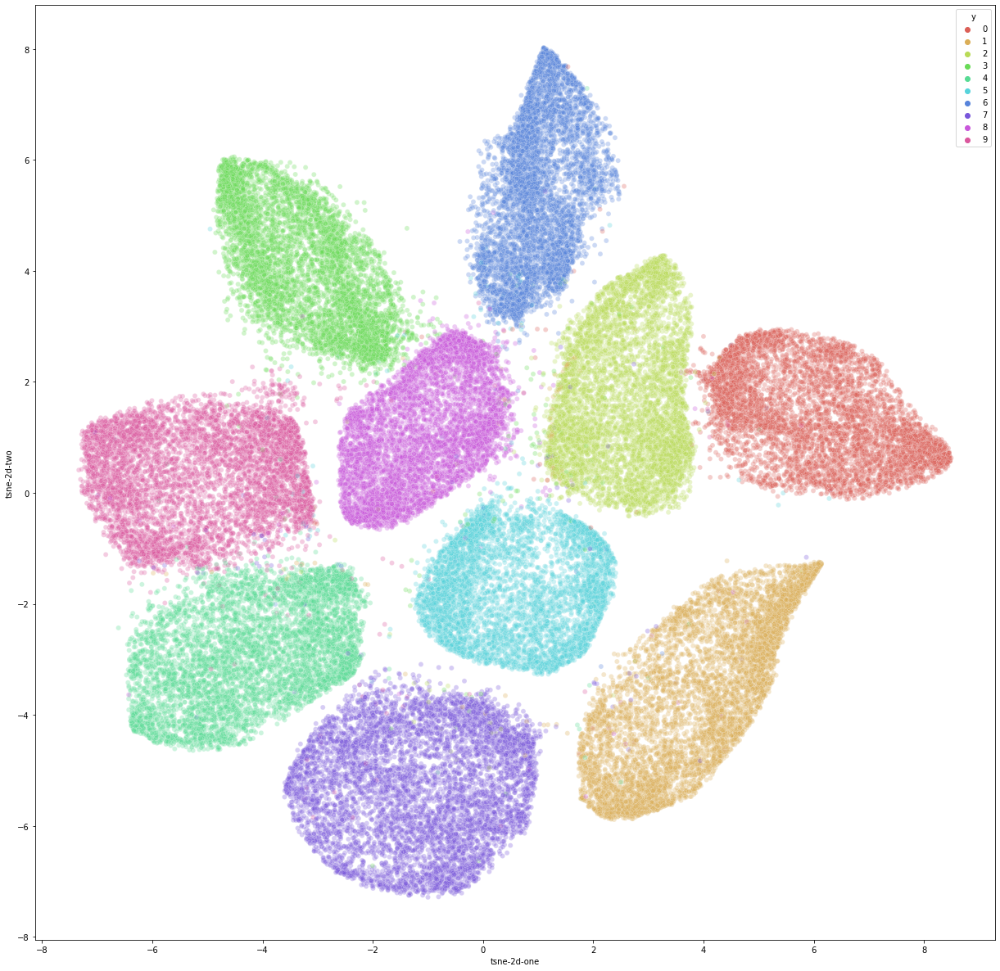

In [20]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(df_a2[range(256)].values)
df_a2['tsne-2d-one'] = tsne_results[:,0]
df_a2['tsne-2d-two'] = tsne_results[:,1]
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

plt.figure(figsize=(21,21))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df_a2,
    legend="full",
    alpha=0.3
)
plt.show()